In [1]:
#%% Imports
# -*- coding: utf-8 -*-
"""
Created on Mon Nov 21 08:27:03 2022

@author: Kongs
"""
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import rasterio as rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from glob import glob
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap, BoundaryNorm
from  matplotlib.cm import ScalarMappable
from rasterio import plot
from rasterio.plot import show
from rasterio.mask import mask
from IPython.display import Image
from IPython.display import HTML, display


## For experimenting with costum color maps see https://matplotlib.org/stable/tutorials/colors/colormap-manipulation.html
def plot_examples(colormaps):
    """
    Helper function to plot data with associated colormap.
    """
    np.random.seed(19680801)
    data = np.random.randn(30, 30)
    n = len(colormaps)
    fig, axs = plt.subplots(1, n, figsize=(n * 2 + 2, 3),
                            constrained_layout=True, squeeze=False)
    for [ax, cmap] in zip(axs.flat, colormaps):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=-4, vmax=4)
        fig.colorbar(psm, ax=ax)
    plt.show()


## Sentinel-2 Bands
The Sentinel-2 bands are displayed in the table below.
B8A is the "last" of the bands when stacking the numpy array. 
As the various resolutions have been resampled to 10 meters via ESA's SNAP toolbox, all combinations of bands can be made

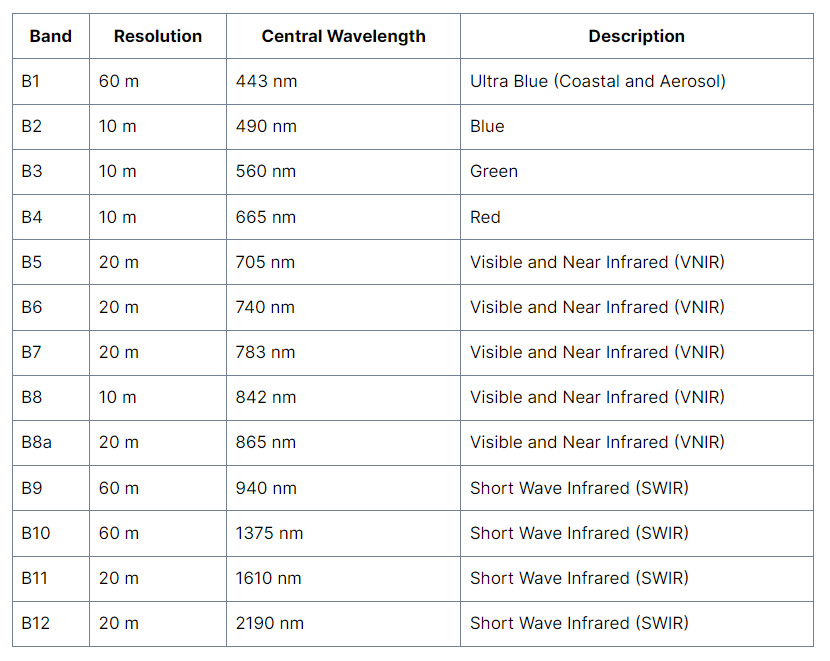

In [2]:
Image(filename = "ext_img/bands_list.PNG", width=700, height=200)

In [3]:
# Load images that has already been sliced and diced in SNAP toolbox

# path = '../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/medium/'
path = '../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger/'

s2_bands = glob(path+'*B*.tif')
s2_bands.sort()

print('Showing all loaded bands, the order they are loaded in and array identifier:')
for ix, ls in enumerate(s2_bands):
    print(ls + f', Array ID [{ix}]')

# Load all bands and stack them in a np array
img = []

for i in s2_bands:
    #print(i)
    with rasterio.open(i, 'r') as f:
        img.append(f.read(1))
        
arr_st = np.stack(img)

Showing all loaded bands, the order they are loaded in and array identifier:
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B01.tif, Array ID [0]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B02.tif, Array ID [1]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B03.tif, Array ID [2]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B04.tif, Array ID [3]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B05.tif, Array ID [4]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B06.tif, Array ID [5]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B07.tif, Array ID [6]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B08.tif, Array ID [7]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B09.tif, 

### Plotting all bands
The bands are rather dark and therefore for visualization, the pixel value has been scaled down to 0-255 in the 13 histograms below. Band 10 is used for top of atmosphere correction and therefore only contains data where a cloud is found. It can be omitted in the remaining processes.

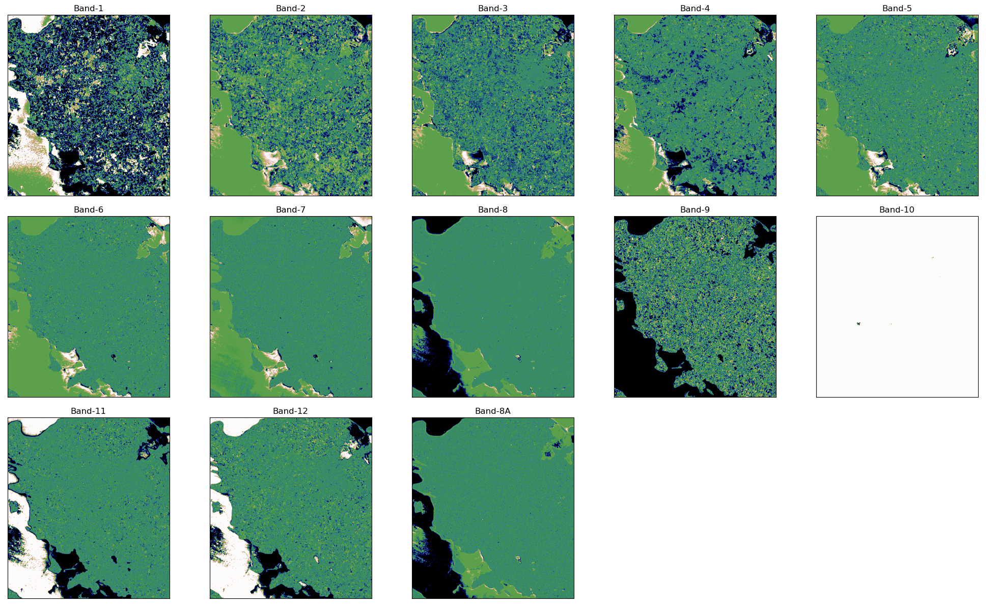

<Figure size 640x480 with 0 Axes>

In [4]:
# Plot all bands side by side.
titles = ('Band-1', 'Band-2', 'Band-3', 'Band-4', 'Band-5', 'Band-6', 'Band-7', 'Band-8', 'Band-9',  'Band-10', 'Band-11' ,'Band-12', 'Band-8A')

arr_st_c = (255*(arr_st - np.min(arr_st))/np.ptp(arr_st)).astype(int) # Sets pixel values between 0-255

ep.plot_bands(arr_st_c, title=titles,
              cmap = 'gist_earth',
              figsize = (20, 12), 
              cols = 5, 
              cbar = False)

plt.tight_layout()

The combined RGB picture is plotted below from the Band-4, Band-3 and Band-2 and shows up as a rather dark image in the subplot below. The values from the bands in this picture are relatively close to each other and therefore have little contrast. By applying the stretch option to the picture, the values are linearly "stretched" out across a set range and now appears brighter in the subplot on the right.

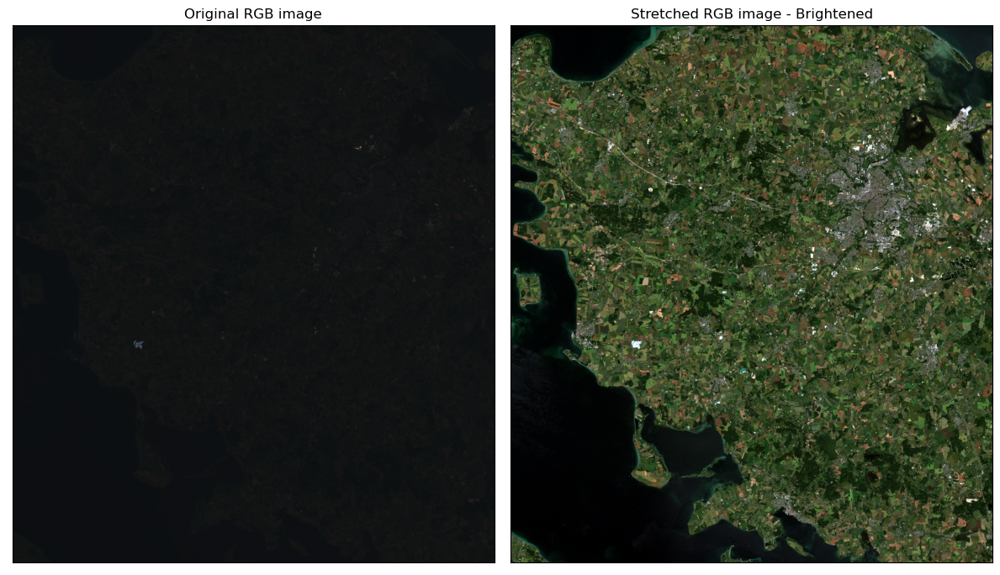

In [5]:
# Plot original RGB composite picture

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 12))

# RGB Composite Image
ax1 = ep.plot_rgb(arr_st, 
            ax=ax1,
            rgb=(3,2,1), 
            figsize=(10, 16),
            title='Original RGB image')

# RGB Composite Image with Strech
ax2 = ep.plot_rgb(arr_st,
            ax=ax2,
            rgb=(3, 2, 1),
            stretch=True, # Extends the values to 0-255 values to increase contrast in image
            str_clip=0.2, # Specify cliping of the data tails
            figsize=(10, 16),
            title='Stretched RGB image - Brightened')


plt.tight_layout() # Auto adjust to fill out subplots

Below are the individual histograms for all bands.

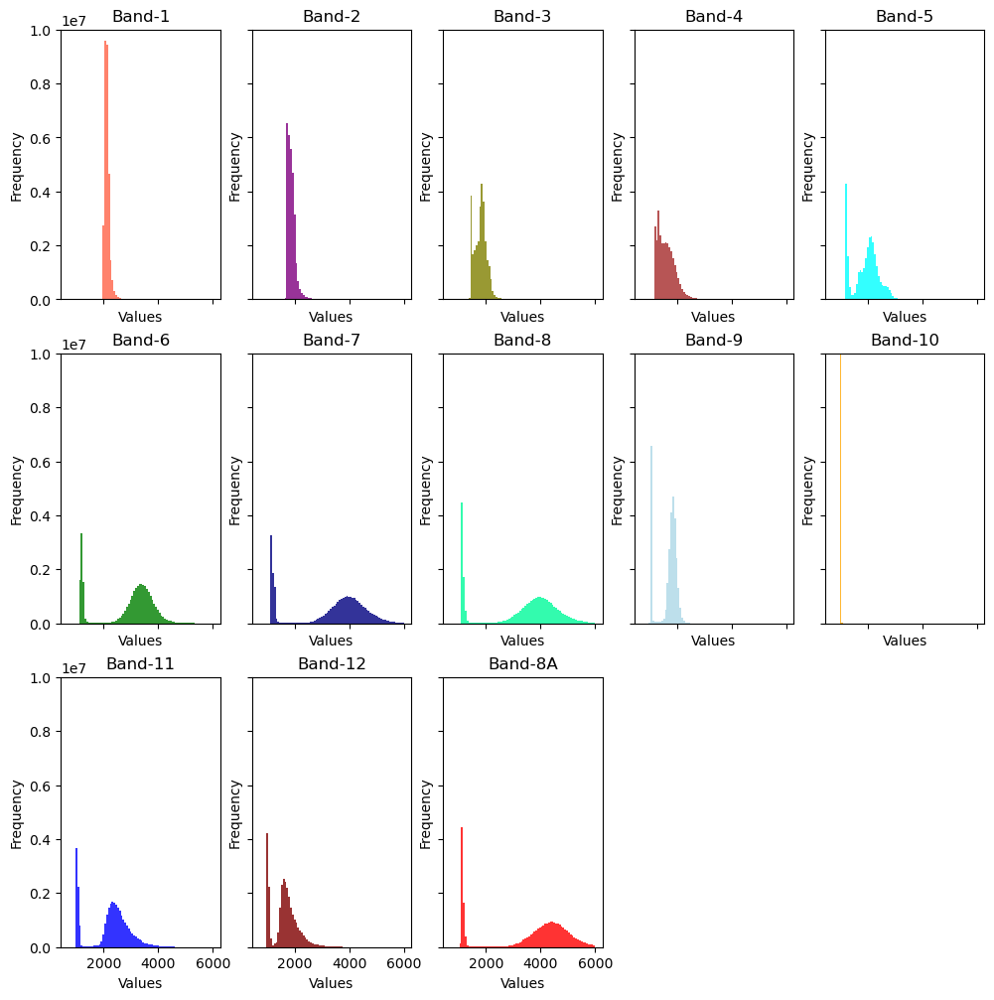

In [6]:
# Plotting histograms
colors = ['tomato', 'purple', 'olive', 'brown', 'cyan', 'green',
          'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue', 'maroon', 'red']

ep.hist(arr_st,
        title=titles,
        colors = colors,
        cols=5, 
        alpha=0.8, 
        bins = 80,
        hist_range=(700,6000),
        xlabel = 'Values',
        ylabel = 'Frequency',
        figsize = (12, 12))

plt.ylim((0,1e7))
plt.show()

## Vegetation metrics

### Normalized Difference Vegetation Index (NDVI)
Healthy green plants are known to absorb radiation which they use as energy in the process of photosynthesis. This is known as the photosynthetically active radation (PAR) region. The plants re-emit most of the solar radiation away in the near-infrared (NIR) spectral region. Therefore healthy green plants will appear darker in PAR, but brighter in NIR. 
This is due to the chlorophyll in the plants which strongly absorbs visible light (400-700 nm) for use in photosynthesis, whilst the cell structure of the leaves reflects energy away in NIR (700-1100 nm). This is why NDVI is generally used as measurement of crop health as lower chlorophyll means less VIS(red) uptake and less NIR reflected, hence the yellow look in less-healthy plants.

The NDVI is calculated as the transformation of the spectral ratio of NIR/VIS(red) and has no functional relationship with a spectral difference (NIR-VIS(red)). 

It is calculated as: 

$$
NDVI = \frac{(NIR-VIS(RED))}{(NIR+VIS(RED))}
$$

For Sentinel-2 that is:
$$
NDVI = \frac{(B8-B4)}{(B8+B4)}
$$

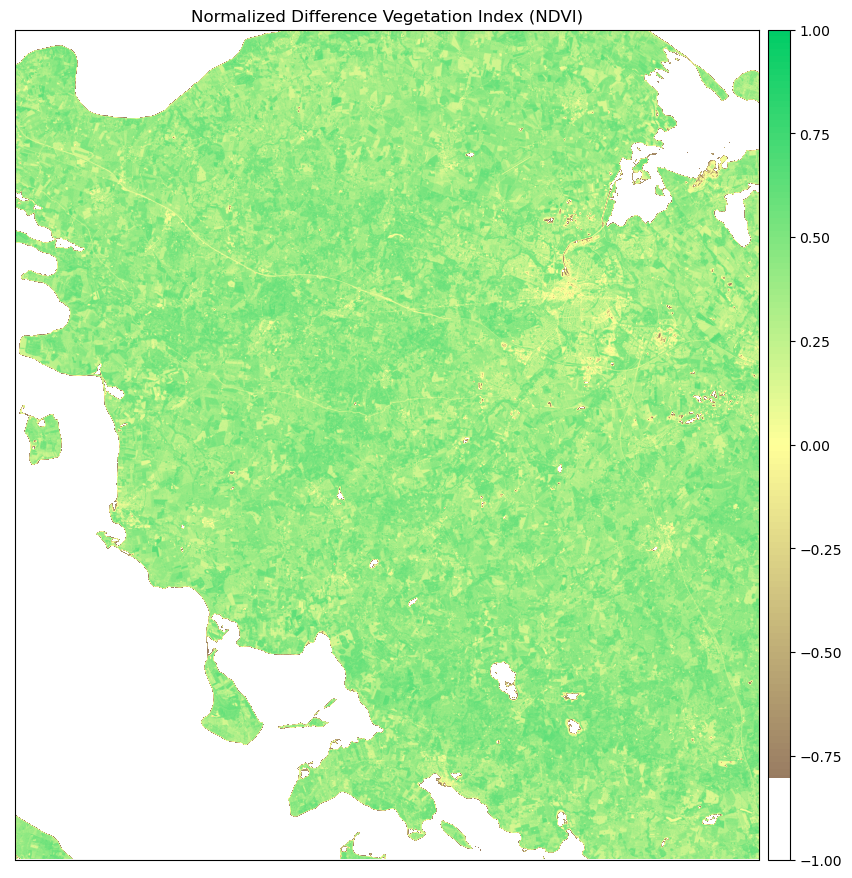

In [7]:
## NDVI Normalised Difference Vegetation Index with continous legend

# Creating costum cmap
terrain_ = mpl.colormaps['terrain_r']
newcolors = terrain_(np.linspace(0.25, 0.75, 256))
white = np.array([256/256, 256/256, 256/256, 1])
newcolors[:25, :] = white
newcmp_ndvi = ListedColormap(newcolors)

# Calculating NDVI
ndvi = ((arr_st[7]-arr_st[3])/(arr_st[7]+arr_st[3]))
ndvi[ndvi > 1] = -1 # For better seeing water

figndvi = ep.plot_bands(ndvi, cmap=newcmp_ndvi, title=['Normalized Difference Vegetation Index (NDVI)'], cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

The normalized difference vegetation index is a simple, but effective index for quantifying green vegetation. It is a measure of the state of vegetation health based on how plants reflect light at certain wavelengths. The value range of the NDVI is -1 to 1. Negative values of NDVI (values approaching -1) correspond to water. Values close to zero (-0.1 to 0.1) generally correspond to barren areas of rock or sand. Low, positive values represent shrub and grassland (approximately 0.2 to 0.4), while high values indicate temperate and tropical rainforests (values approaching 1)

### Defining classes based on NDVI values
The image below shows the NDVI image but visualized as classes. This visual aid helps identifying regions, in particular urban areas which show up as grey and is surrounded by areas of low vegetation. 

* Grey - No vegetation (City, highways, gravel pits)  
* Brown/Yellow - Bare area  
* Light green - Low vegetation 
* Green - Moderate vegetation 
* Dark Green - Dense vegetation 
* Blue - Water

*Good source on NDVI: https://eos.com/blog/ndvi-faq-all-you-need-to-know-about-ndvi/*

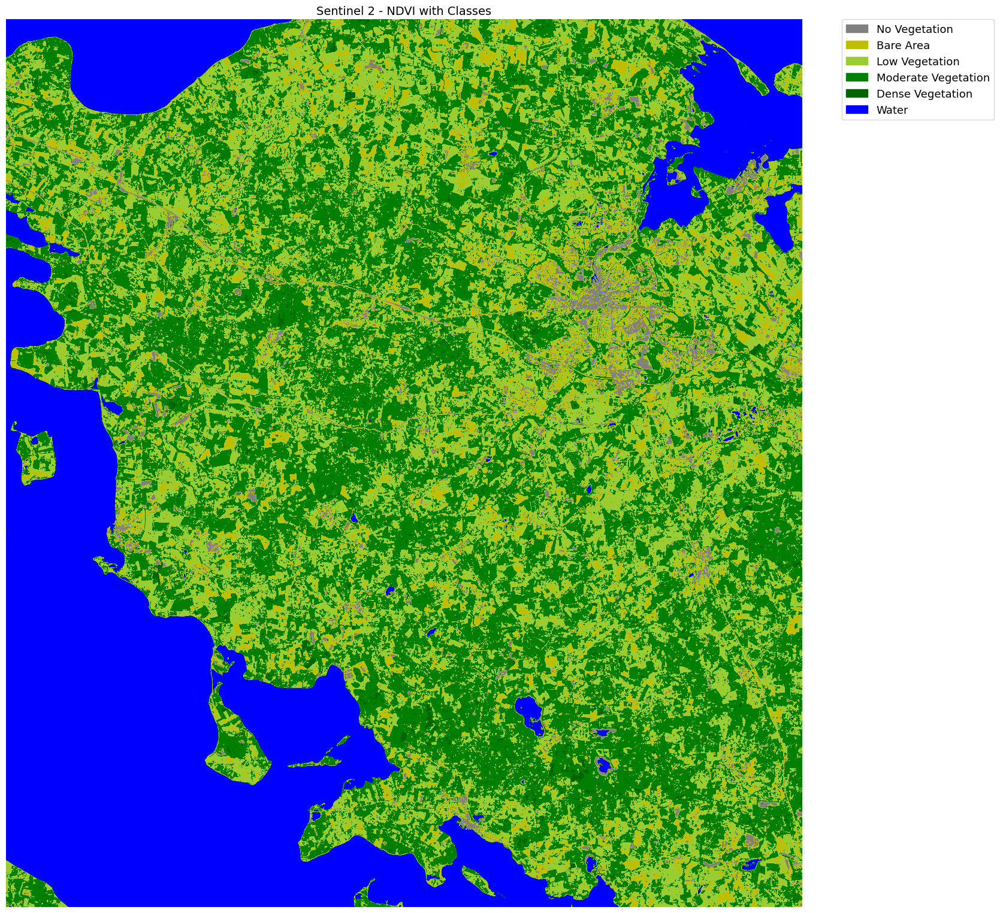

In [8]:
# NDVI With classes colored

ndvi = es.normalized_diff(arr_st[7], arr_st[3])
ndvi_class_bins = [-np.inf, 0, 0.15, 0.25, 0.4, 0.6, 1.0, np.inf]
ndvi_sent_class = np.digitize(ndvi, ndvi_class_bins)
ndvi_sent_class = np.ma.masked_where(
    np.ma.getmask(ndvi), ndvi_sent_class
)
np.unique(ndvi_sent_class)

# Define color map
nbr_colors = ["gray", "y", "yellowgreen", "g", "darkgreen", 'blue']
nbr_cmap = ListedColormap(nbr_colors)

# Define class names
ndvi_cat_names = [
    "No Vegetation",
    "Bare Area",
    "Low Vegetation",
    "Moderate Vegetation",
    "Dense Vegetation",
    "Water",
]

# Get list of classes
classes = np.unique(ndvi_sent_class)
classes = classes.tolist()
# The mask returns a value of none in the classes. remove that
classes = classes[0:6]

# Plot your data
fig, ax = plt.subplots(figsize=(16, 16))
im = ax.imshow(ndvi_sent_class, cmap=nbr_cmap)

ep.draw_legend(im_ax=im, classes=classes, titles=ndvi_cat_names)
ax.set_title(
    "Sentinel 2 - NDVI with Classes",
    fontsize=14,
)
ax.set_axis_off()

# Auto adjust subplot to fit figure size
plt.tight_layout()

Plotting the NDVI and the classes defined from the NDVI values in the subplot below shows a relatively accurate definition of the various classes. Cities generally show up as no vegetation areas.  Agricultural fields, shrub/grass land and forrests stands out quite well and large water bodies are well defined. 

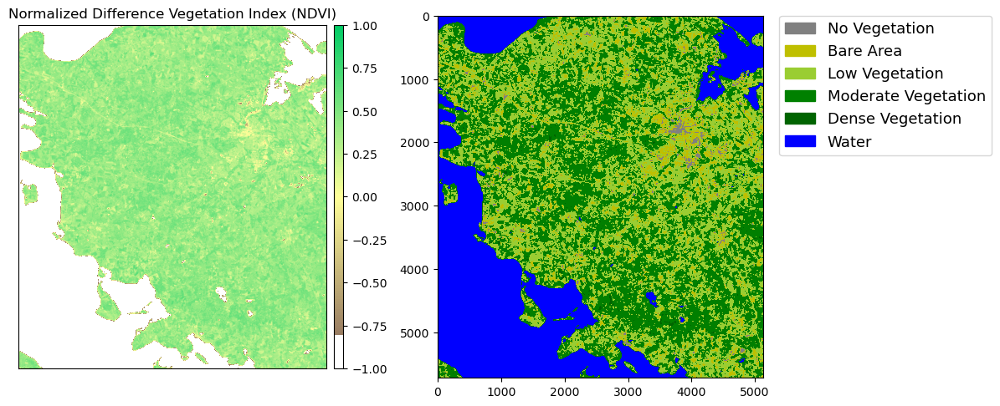

In [9]:
## Plotting the two side by side
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 12))

ndvi[ndvi > 1] = -1 #For better seing water
ax1 = ep.plot_bands(ndvi, cmap=newcmp_ndvi, title=['Normalized Difference Vegetation Index (NDVI)'], cols=1, vmin=-1, vmax=1, figsize=(10, 14), ax=ax1)
ax2 = ax2.imshow(ndvi_sent_class, cmap=nbr_cmap)
ep.draw_legend(im_ax=ax2, classes=classes, titles=ndvi_cat_names)

# Auto adjust subplot to fit figure size
plt.tight_layout()

### Quick look at the weather
If we take a quick look at the forecast from the Danish meteorological institute on the day the Sentinel-2 images were taken, which are shown below, we can see that it was a dry and relatively summer for Denmark. The drought index (Tørkeindeks) is high and precipitation (Nedbør) is currently low except for some minor precipitation about a week ago. The temperature for the region (Faaborg-Midtfyn county) has been relatively warm and it is on the rise.
With this information on hand, lets see if we can see this effect on the region by taking a look on some more satellite based infomation.

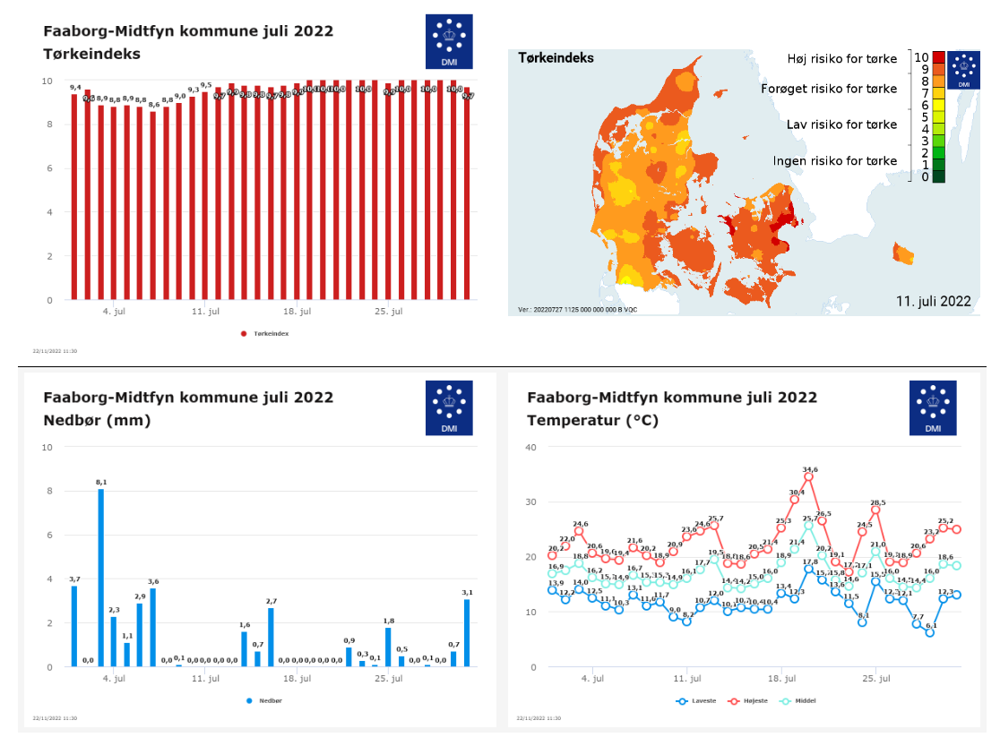

In [10]:
Image(filename = "ext_img/githubfriendly_forecasts.PNG")

### Soil Adjusted Vegetation index (SAVI)
SAVI was establish as a means to create better NDVI products since NDVI tends to be unstable as it is influenced by soil moisture, soil color and saturation effects from high density vegetation. SAVI is a vegetation index that takes into account the differential red and near infrared extinction through the vegetation canopy. This index is a transformation technique that minimizes soil brightness influence from spectral vegetation indicies that involve red and near-infrared wavelengths. 

It is calculated as:

$$
SAVI = \frac{(NIR-VIS(red))}{(NIR+VIS(red)+L)} \cdot (1+L)
$$

For Sentinel-2 that is:
$$
SAVI = \frac{(B8-B4)}{(B8+B4+L)} \cdot (1+L)
$$

The variable L is a canopy background adjustment factor, where a value of 0.5 in reflectance was found to minimize soil brightness variations and eliminates the need to calibrate for different soils. This transformation was found to nearly eliminate soil-induced variations in vegetation indices. 

L values used:
* L = 0.0 Very high vegetation cover area (Thus equal to NDVI)
* L = 0.5 Moderate vegetation cover area
* L = 1.0 No green vegetation cover area (Arid)

*Citation: [Huete, A.R (August 1988). "A soil-adjusted vegetation index (SAVI)". Remote Sensing of Environment. 25 (3): 295–309. doi:10.1016/0034-4257(88)90106-X](https://www.sciencedirect.com/science/article/abs/pii/003442578890106X?via%3Dihub)*

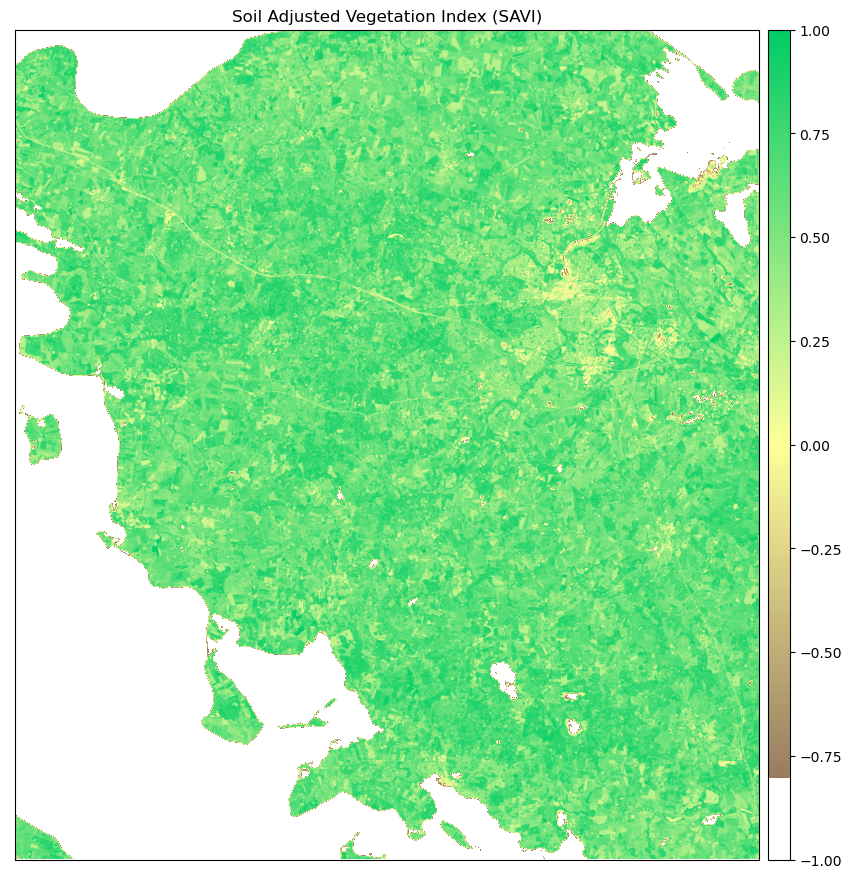

In [11]:
# Soil adjusted vegetation index (SAVI)

L = 0.5

savi = ((arr_st[7] - arr_st[3]) / (arr_st[7] + arr_st[3] + L)) * (1 + L)
savi[savi > 1] = -1 #For better seing water
figsavi = ep.plot_bands(savi, cmap=newcmp_ndvi, title='Soil Adjusted Vegetation Index (SAVI)', cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

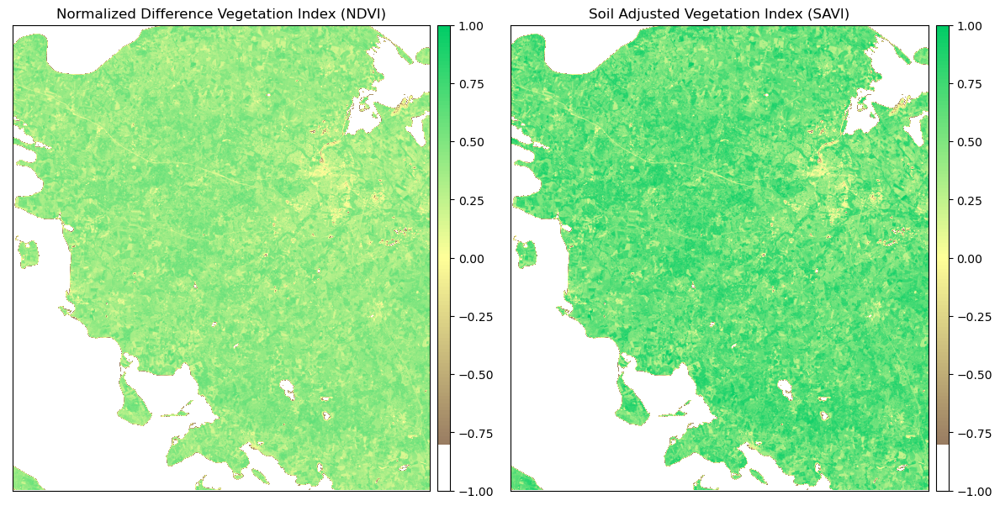

In [12]:
# Comparison of SAVI and NDVI

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 12))

# NDVI
ndvi[ndvi > 1] = -1 #For better seing water
ax1 = ep.plot_bands(ndvi, cmap=newcmp_ndvi, title='Normalized Difference Vegetation Index (NDVI)', cols=1, vmin=-1, vmax=1, ax=ax1)

# SAVI
savi[savi > 1] = -1 #For better seing water
ax2 = ep.plot_bands(savi, cmap=newcmp_ndvi, title='Soil Adjusted Vegetation Index (SAVI)',         cols=1, vmin=-1, vmax=1, ax=ax2)

plt.tight_layout() # Auto adjust to fill out subplots

### NDVI and SDVI comparison
As seen in the image above, the soil adjusted vegetation index takes into account soil brightness and attempts to minimize its effect. It is clear in this comparison that the SAVI subplot now is less effected by the soil reflection and we observe a general increase in positive values (More and darker green). By examining the histograms as seen below, we can also see the values shift to the higher values. This suggests that when correcting for soil brightness, we get a more realistic picture of the current state of the vegetation.

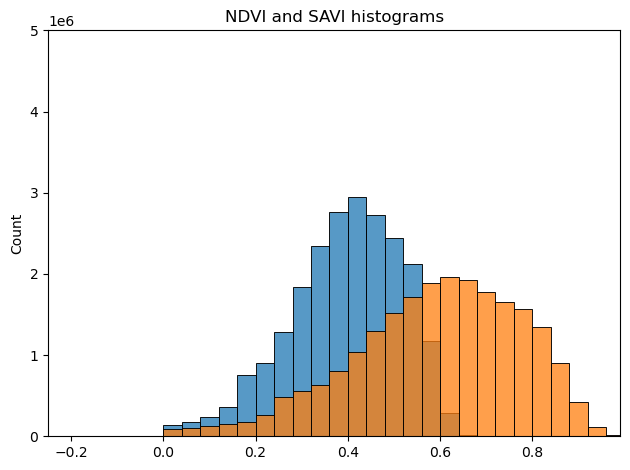

In [13]:
histndvi = 2*(ndvi-np.min(ndvi))/(np.max(ndvi)-np.min(ndvi))-1
histndvi1 = histndvi.flatten()
sns.histplot(data=histndvi1, bins=50)

histsavi = 2*(savi-np.min(savi))/(np.max(savi)-np.min(savi))-1
histsavi1 = histsavi.flatten()
sns.histplot(data=histsavi1, bins=50)

ax = plt.gca()
ax.set_xlim([-0.25, 0.99])
ax.set_ylim([0, 5.0e6])
ax.set_title('NDVI and SAVI histograms')

plt.tight_layout() # Auto adjust to fill out subplots

## Water metrics
Surface water and water content is another metric that can be extracted from satellite imagery and provides useful information in understanding crop health and the impact of droughts. It can also serve as information in understanding the risks of wildfires.

### Normalized Difference Water Index (NDWI)

The NDWI is used to monitor changes related to water content in water bodies. As water bodies strongly absorb light in visible to infrared electromagnetic spectrum, NDWI uses green and near infrared bands to highlight water bodies. It is sensitive to built-up land and can result in over-estimation of water bodies. The index was proposed by McFeeters, 1996.

The normalized difference water index is most appropriate for water body mapping. Values of water bodies are larger than 0.5.  Built-up features have positive values between zero and 0.2. Vegetation has smaller values.

$$
NDWI = \frac{Green-NIR}{Green+NIR}
$$

For Sentinel-2 that is:
$$
NDWI = \frac{(B3-B8)}{(B3+B8)}
$$


*Source: https://en.wikipedia.org/wiki/Normalized_difference_water_index*

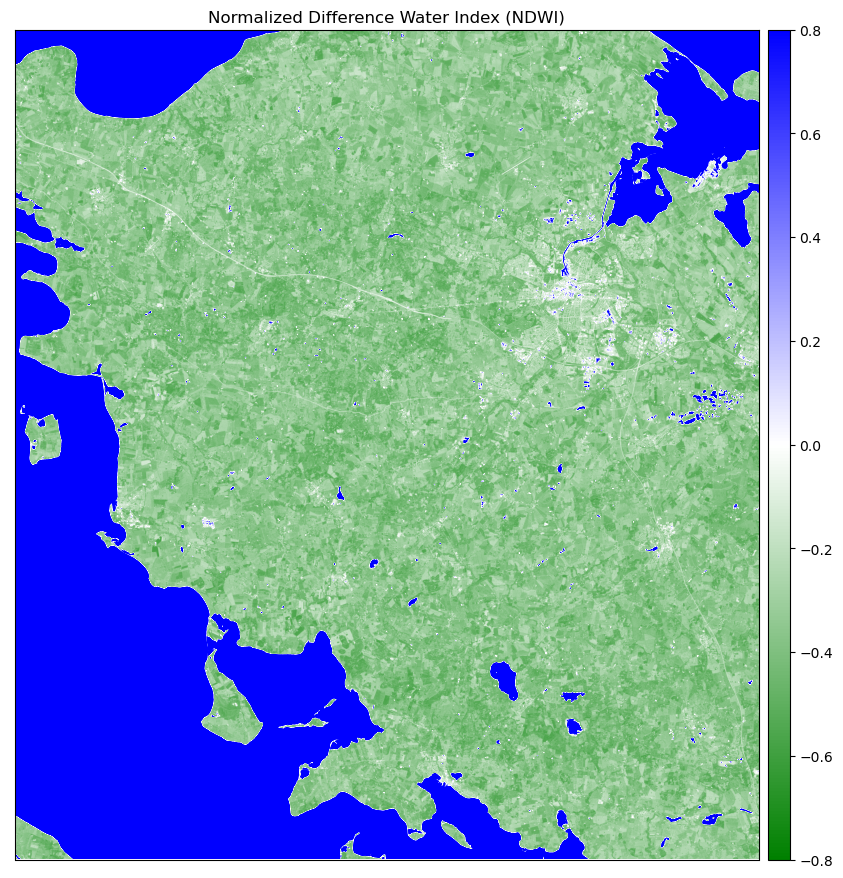

In [14]:
# Normalized Difference Water Index

# Define new CMAP 
colors = ['green', "white", "blue"]
cmap1 = LinearSegmentedColormap.from_list("mycmap", colors)

# Calculate NDWI
ndwi = es.normalized_diff(arr_st[7], arr_st[2]) 

ndwi = ndwi * -1 # Flipping scale for plotting ease 
ndwi[ndwi < -1] = 1 # For better seing water
ep.plot_bands(ndwi, cmap=cmap1, title='Normalized Difference Water Index (NDWI)', cols=-0.8, vmin=-0.8, vmax=0.8, figsize=(10, 14))
plt.show()

### Normalized Difference Moisture Index (NDMI)

The NDMI is a normalized difference moisture index, that uses NIR and SWIR bands to display moisture. The SWIR band reflects changes in both the vegetation water content and the spongy mesophyll structure in vegetation canopies, while the NIR reflectance is affected by leaf internal structure and leaf dry matter content but not by water content. The combination of the NIR with the SWIR removes variations induced by leaf internal structure and leaf dry matter content, improving the accuracy in retrieving the vegetation water content. The amount of water available in the internal leaf structure largely controls the spectral reflectance in the SWIR interval of the electromagnetic spectrum. SWIR reflectance is therefore negatively related to leaf water content. In short, NDMI is used to monitor changes in water content of leaves, and was proposed by Gao (See source below). NDWI is computed using the near infrared (NIR) and the short wave infrared (SWIR) reflectance’

The normalized difference moisture Index (NDMI) is used to determine vegetation water content and monitor droughts. The value range of the NDMI is -1 to 1. Negative values of NDMI (values approaching -1) correspond to barren soil. Values around zero (-0.2 to 0.4) generally correspond to water stress. High, positive values represent high canopy without water stress (approximately 0.4 to 1).

$$
NDMI = \frac{NIR-SWIR}{NIR+SWIR}
$$

For Sentinel-2 that is:
$$
NDMI = \frac{(B8-B11)}{(B8+B11)}
$$

*Source: Gao, B.-C. 1996. NDWI - A normalized difference water index for remote sensing of vegetation liquid water from space. Remote Sensing of Environment 58: 257-266.  https://www.sciencedirect.com/science/article/abs/pii/S0034425796000673*

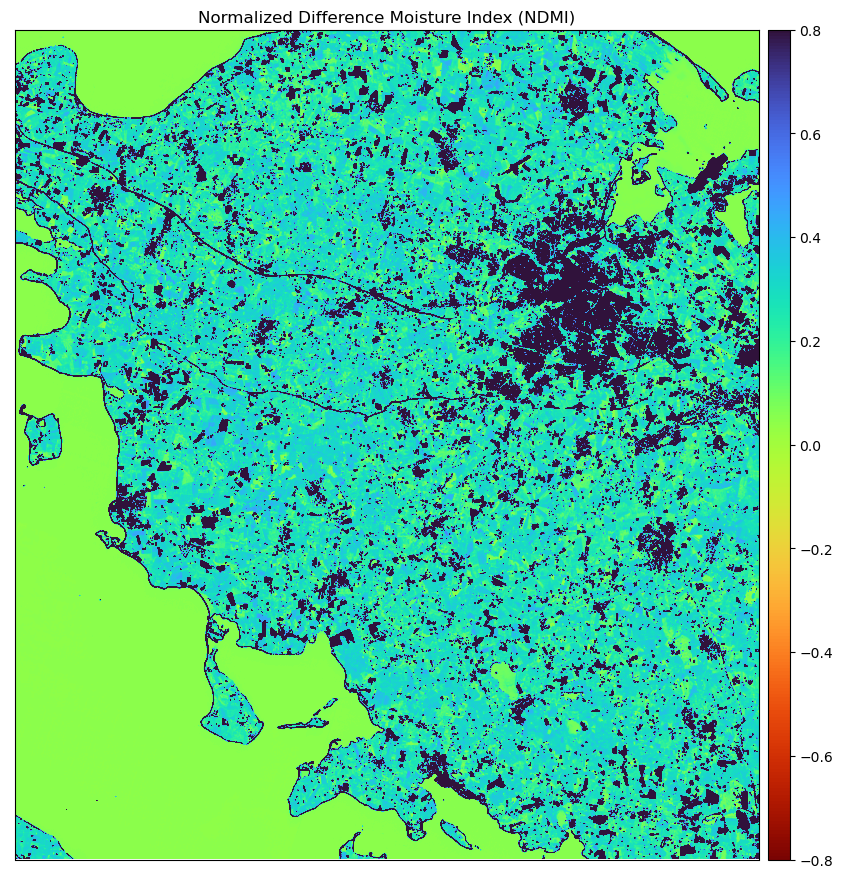

(0.0, 250000.0)

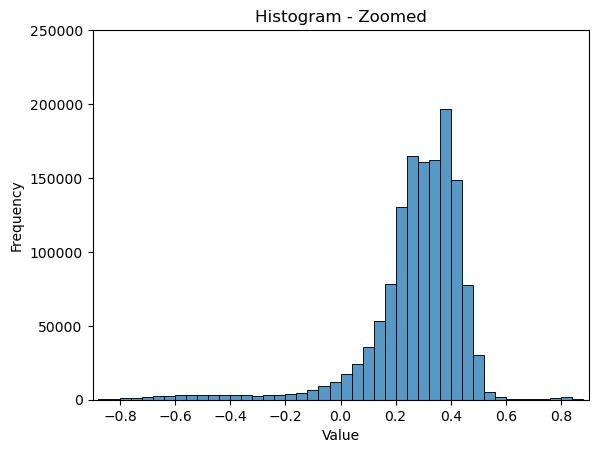

In [15]:
# NDMI normalized difference moisture index

ndmi = ((arr_st[7]-arr_st[10])/(arr_st[7]+arr_st[10]))

ep.plot_bands(ndmi, cmap='turbo_r', title='Normalized Difference Moisture Index (NDMI)', cols=0.8, vmin=-0.8, vmax=0.8, figsize=(10, 14))

plt.show()

## Histogram - Normalize values from -1 to 1
histndmi = 2*(ndmi-np.min(ndmi))/(np.max(ndmi)-np.min(ndmi))-1
histndmi1 = histndmi.flatten()
histndmi1 = histndmi1 *-1
sns.histplot(data=histndmi1, bins=50)
plt.title('Histogram - Zoomed')
plt.xlabel('Value')
plt.ylabel('Frequency')
ax = plt.gca()
ax.set_xlim([-0.9, 0.9])
ax.set_ylim([0, 0.25e6])

This region is fairly green and with no barren soil, and given the map plot above is mostly green/blue with little red present, one can jump to a conclusion of everything looking fine. However, by plotting a histogram we can better see how much of the area is found to be in the range of -0.25 to 0.4. As written above values within these numbers are regarded as being in a state of water stress. As indicated by the histogram, we find that a large proportion of the crops are infact in the high end of this range, sitting at 0.20-0.35. This is in agreement with the weather metrics posted earlier that shows a period of low precipitation, high heat and generally high drought parameters.
The very dark areas capping out at 1.00 are generally cities and infrastructure.

### Clay ratio
Determining geological parameters is particular difficult as the surface is a mixture of various minerals all with their own spectral signature and the vegetation is influencing reflection and absorbtion. However in areas with homogenous land, less vegetation and in combination with in-situ geological/geochemical data, it is possible to derive some geological information from satellites data. 
In this particular example the clay ratio is being assessed by examining the two SWIR bands B11 and B12. Hydrous minerals such as clays absorb radiation in the 2.0 - 2.3 micron portion of the spectrum. However I'd advise to take this result with a gram of clay(salt), for the reasions specified above and that it is best correlated with in-situ data.

$$
Clay ratio = \frac{SWIR 11}{SWIR 12}
$$

For Sentinel-2 that is:
$$
Clay ratio = \frac{(B11)}{(B12)}
$$


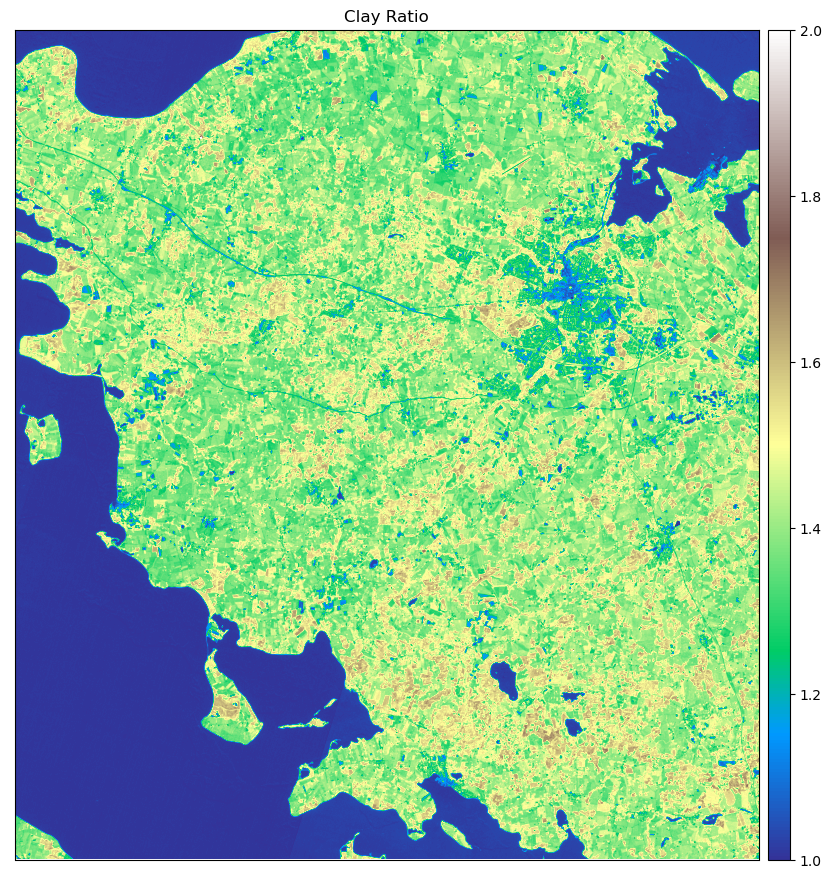

In [16]:
# Geology indices

cmr = (arr_st[10]/arr_st[11])

ep.plot_bands(cmr, cmap="terrain", title='Clay Ratio', cols=1, vmin=1, vmax=2, figsize=(10, 14))

plt.show()

## Using false color images

False color images utilizes the information in bands outside of the visible spectrum with the addition of a visible band to create images for us to see. 

As an example the "geology band" combination is a neat application for finding geological features. This includes faults, lithology, and geological formations. Below is an example with the SWIR-2 (B12), SWIR-1 (B11), and blue (B2) bands.

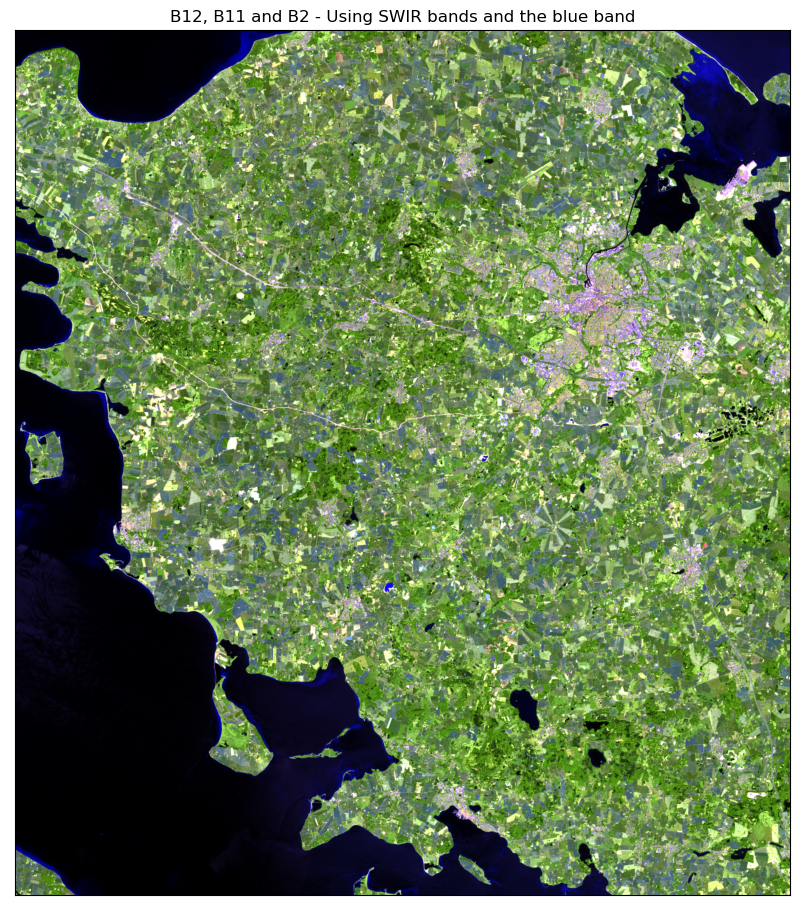

In [17]:
ep.plot_rgb(arr_st,
            rgb=(11, 10, 1),
            stretch=True, # Extends the values to 0-255 values to increase contrast in image
            #str_clip=0.1, # Specify cliping of the data tails
            figsize=(10, 16),
            title='B12, B11 and B2 - Using SWIR bands and the blue band')


plt.show() # Auto adjust to fill out subplots

### Suspended coastal sediment
Using the B4, B3 and B1 is helpful when investigating coastal environments. This particular combination uses the coastal aerosal band which is helpful in estimating suspended sediment in the water. As seen in the picture below, the bathymetric off the coastal regions light up. Cities also become clearer.

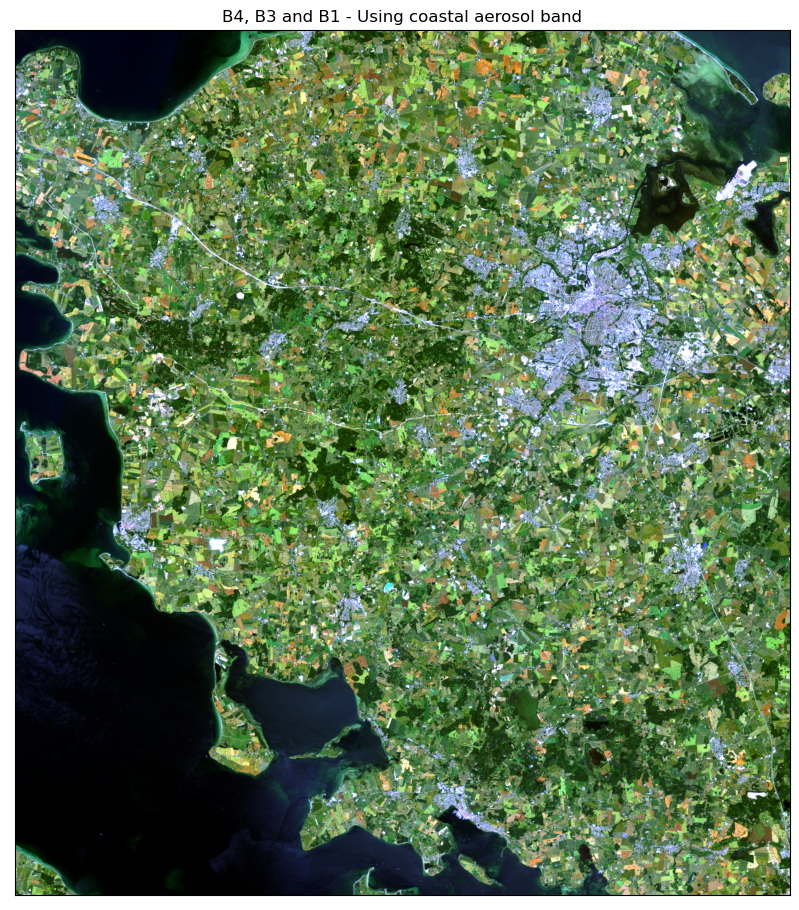

In [18]:
ep.plot_rgb(arr_st,
            rgb=(3, 2, 0),
            stretch=True, # Extends the values to 0-255 values to increase contrast in image
            #str_clip=0.2, # Specify cliping of the data tails
            figsize=(10, 16),
            title='B4, B3 and B1 - Using coastal aerosol band')


plt.show() # Auto adjust to fill out subplots

### Machine learning part

To access the machine learning part I have divided it into 2 new notebooks. I have made 1 for unsupervised machine learning using K-means and a second notebook for supervised machine learning where we test several classification methods on a synthethic "ground truth" data.

1) [Machine learning Unsupervised](https://github.com/Kongstad/Vegetation_Analysis/tree/main/Jupyter_Notebook/Machine_Learning_Unsupervised.ipynb)
2) [Machine learning Supervised](https://github.com/Kongstad/Vegetation_Analysis/tree/main/Jupyter_Notebook/Machine_Learning_Supervised.ipynb)